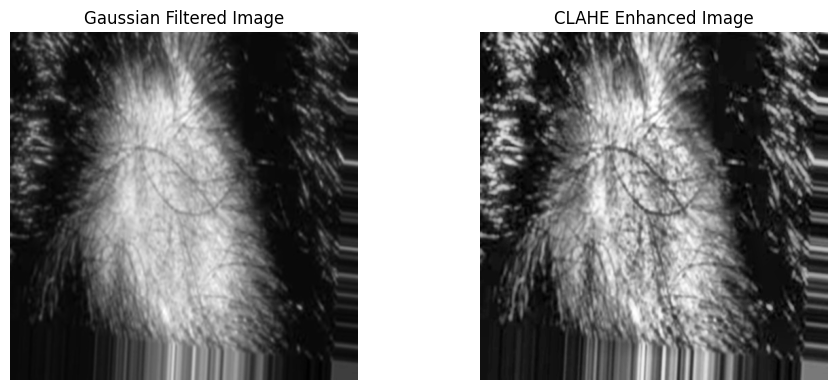

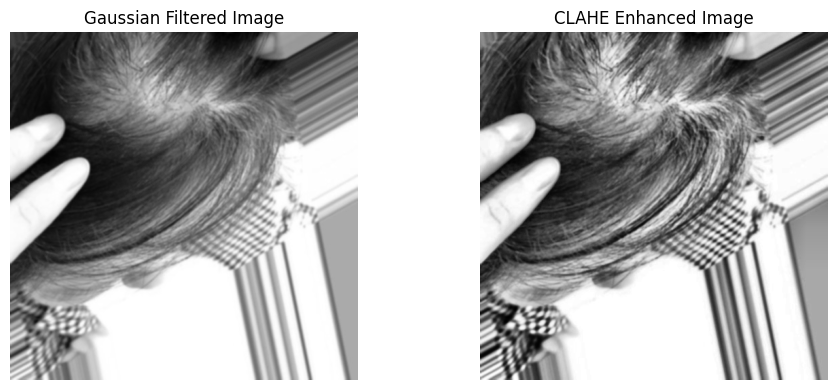

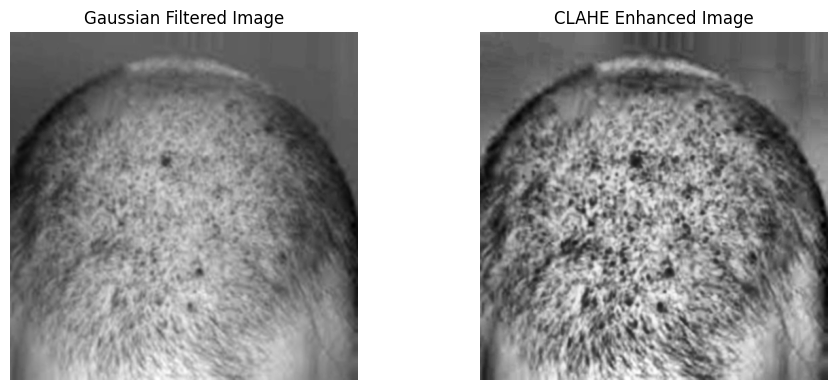

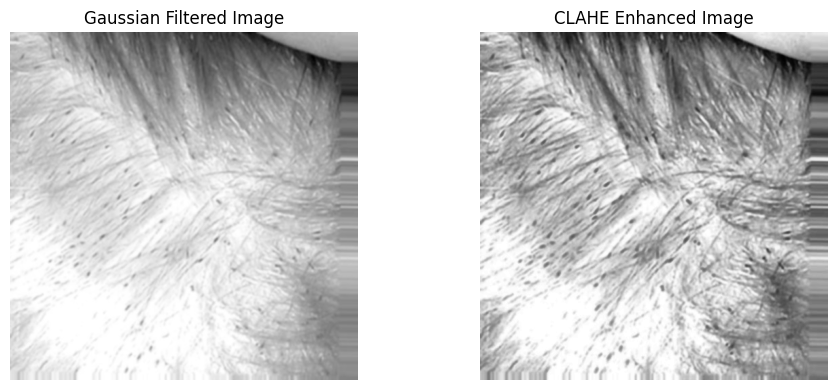

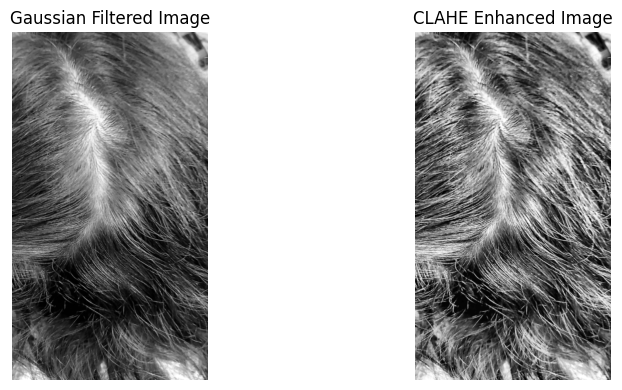

...

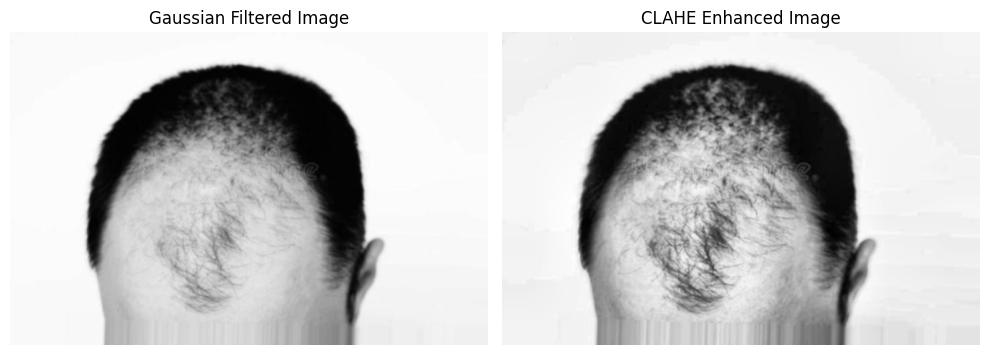

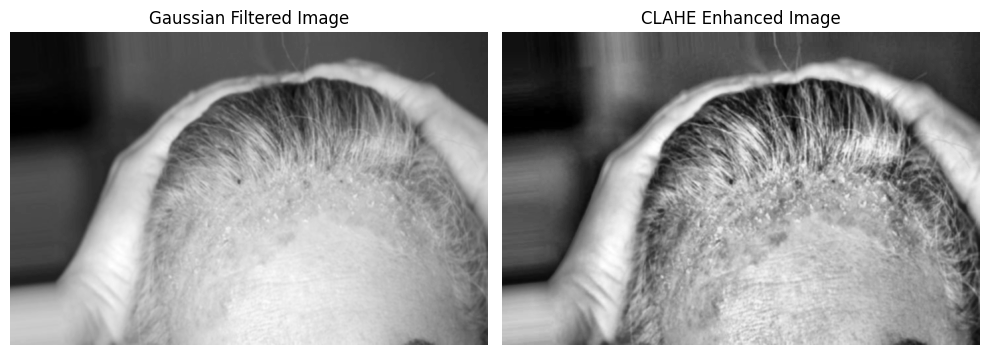

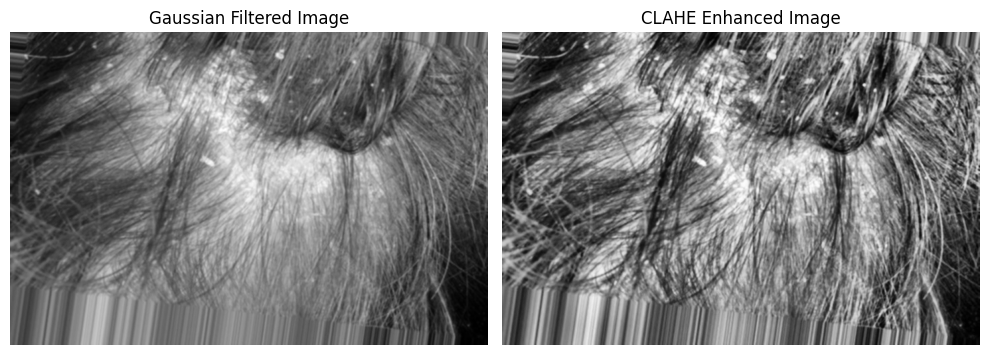

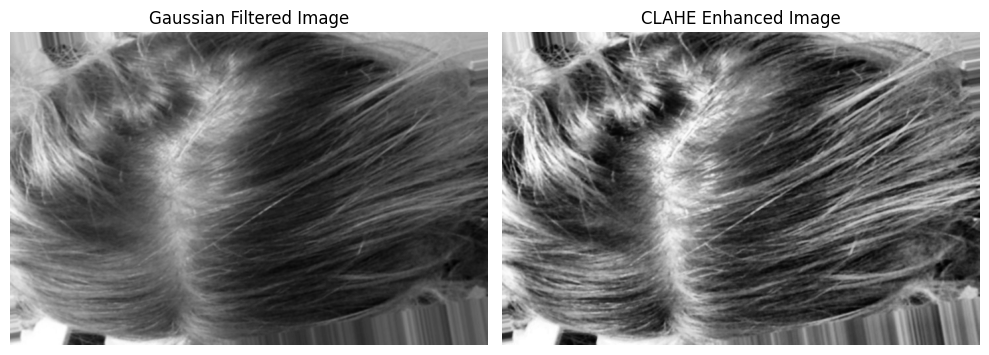

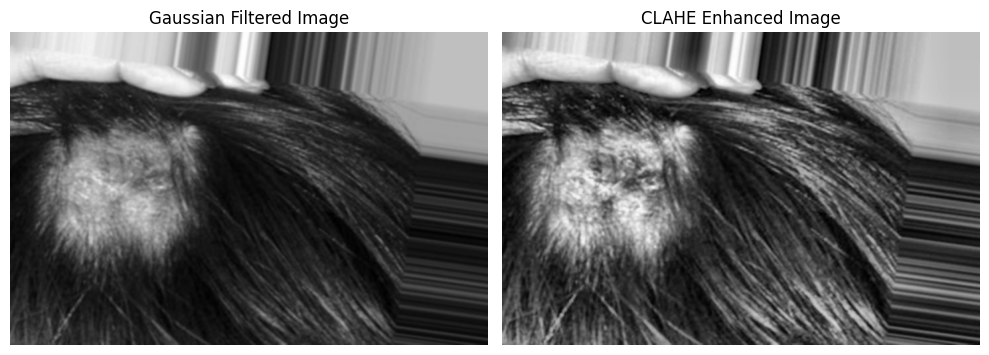

In [9]:
import cv2
import os
import matplotlib.pyplot as plt

def apply_clahe(image, plot=False):
    """
    Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the image for contrast enhancement.
    Parameters:
    - image: Input image.
    - plot: Whether to plot the enhanced image or not.
    """
    # Create a CLAHE object
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    # Apply CLAHE to the input image
    clahe_image = clahe.apply(image)

    if plot:
        # Plot the original and CLAHE images
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(image, cmap='gray')
        plt.title('Gaussian Filtered Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(clahe_image, cmap='gray')
        plt.title('CLAHE Enhanced Image')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return clahe_image

def process_gaussian_images_for_clahe(gaussian_folder, clahe_output_folder):
    """
    Process existing Gaussian-filtered images by applying CLAHE and save the enhanced images.
    """
    # Ensure the CLAHE output folder exists
    if not os.path.exists(clahe_output_folder):
        os.makedirs(clahe_output_folder)

    for root, dirs, files in os.walk(gaussian_folder):
        # Process each disease folder separately
        for disease_folder in dirs:
            disease_folder_path = os.path.join(root, disease_folder)
            image_found = False

            # Ensure the output path for this disease folder exists
            relative_path = os.path.relpath(disease_folder_path, gaussian_folder)
            output_subfolder = os.path.join(clahe_output_folder, relative_path)
            if not os.path.exists(output_subfolder):
                os.makedirs(output_subfolder)

            # Process only the files in the disease folder
            for filename in os.listdir(disease_folder_path):
                image_path = os.path.join(disease_folder_path, filename)

                # Check if the path is a file
                if os.path.isfile(image_path):
                    # Read the Gaussian-filtered image in grayscale mode
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                    # Check if the image was successfully read
                    if image is None:
                        print(f"Error reading image: {image_path}")
                        continue

                    # Plot only one image per folder for visualization
                    plot_image = not image_found

                    # Apply CLAHE for contrast enhancement
                    clahe_image = apply_clahe(image, plot=plot_image)

                    # Save the CLAHE-enhanced image
                    output_path = os.path.join(output_subfolder, f"clahe_{filename}")
                    cv2.imwrite(output_path, clahe_image)

                    image_found = True  # Mark this folder as having an image plotted

if __name__ == "__main__":
    gaussian_folder_path = r'E:\Project\hair diseases detection\Gaussian Filter\gaussian_images'
    clahe_output_folder_path = r'E:\Project\hair diseases detection\gaussian_clahe_images'

    # Process all Gaussian-filtered images for CLAHE enhancement
    process_gaussian_images_for_clahe(gaussian_folder_path, clahe_output_folder_path)
